In [15]:
from tensor import Tensor
from linear import Linear
from mse_loss import MSELoss
import numpy as np
import torch
from sequential import Sequential
from relu import ReLU
from sgd import SGD
import matplotlib.pyplot as plt

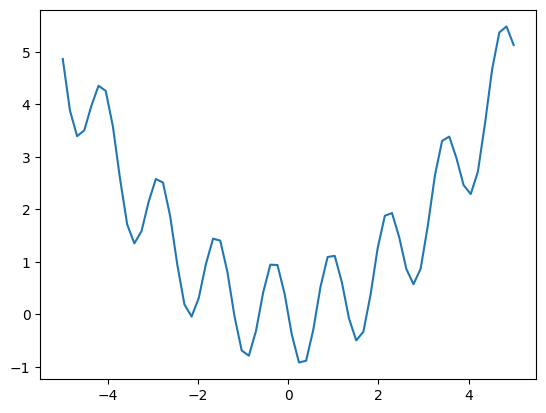

In [16]:
min_x = -5
max_x = 5
n_points = 64

# function to learn
f = lambda x: 0.2 * x**2 - np.sin(x * 5)

x = np.linspace(min_x, max_x, n_points)
y = np.array([f(p) for p in x])

plt.plot(x, y)
plt.show()

X = Tensor(x.reshape(-1, 1))

# left = 0, right = 1 
y_true = Tensor(y.reshape(-1, 1))

hidden_dim = 32

nn = Sequential(
    Linear(1, hidden_dim),
    ReLU(),
    Linear(hidden_dim, hidden_dim),
    ReLU(),
    Linear(hidden_dim, 1)
)

In [17]:
sgd = SGD(nn.get_params(), lr=1e-3)
criterion = MSELoss()

In [18]:

n_epochs = 300_000

for epoch_idx in range(n_epochs):

    logits = nn.forward(X)

    loss = criterion.forward(logits, y_true)

    sgd.zero_grad()

    print(f"Loss = {loss.value}")

    loss.backward()

    sgd.step()

Loss = 19.638893071919966
Loss = 4.180736036829976
Loss = 2.010271251770447
Loss = 1.288450350028082
Loss = 0.9559842417819426
Loss = 0.7974525836282593
Loss = 0.720215800617327
Loss = 0.6823970201908633
Loss = 0.6631985209417148
Loss = 0.6528503162396154
Loss = 0.6467587412001055
Loss = 0.642671063557338
Loss = 0.6396676055418892
Loss = 0.6371618895226013
Loss = 0.6349233177226001
Loss = 0.6328003886051282
Loss = 0.6307723843593693
Loss = 0.628795391490568
Loss = 0.6268557429366499
Loss = 0.6249640598111736
Loss = 0.6230879656932369
Loss = 0.6213155737857874
Loss = 0.6195489674043175
Loss = 0.6178330751297293
Loss = 0.6161234125656763
Loss = 0.614449837274601
Loss = 0.6127906128933878
Loss = 0.6111582499634146
Loss = 0.609544994780111
Loss = 0.6079549062813907
Loss = 0.6063858089499021
Loss = 0.6048370117960506
Loss = 0.60330868558353
Loss = 0.6018472722163903
Loss = 0.6004346588461874
Loss = 0.5990442581321216
Loss = 0.5976651855165986
Loss = 0.5963342192801512
Loss = 0.5950050227927

In [19]:
def plot_learned_function(nn, min_x, max_x, n_points, x, y):

    x_new = np.linspace(min_x, max_x, n_points)

    y_pred = nn.forward(Tensor(x_new.reshape(-1,  1))).value.flatten()

    plt.plot(x_new, y_pred, label="predicted")
    plt.scatter(x, y, label="data", c="red")
    plt.legend()
    plt.show()

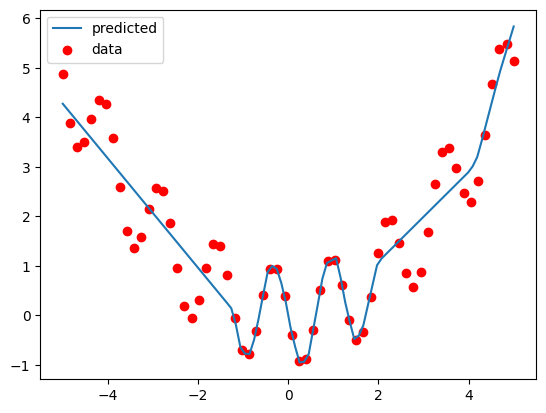

In [21]:
plot_learned_function(nn, min_x=min_x, max_x=max_x, n_points=100, x=x, y=y)